### Student Information
Name: 林曉彬

Student ID: 108061631

GitHub ID: Hsiao-Ping

---

### Instructions

1. First: do the **take home** exercises in the [DM19-Lab1-Master Repo](https://github.com/EvaArevalo/DM19-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM19-Lab1-Master Repo](https://github.com/EvaArevalo/DM19-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/EvaArevalo/DM19-Lab1-Master/blob/master/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Oct. 29th 11:59 pm, Tuesday)__. 

### >>> **Part 1 :**

In [1]:
### Begin Assignment Here

# necessary for when working with external scripts
%load_ext autoreload
%autoreload 2
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups
twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)
import numpy as np
import pandas as pd
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

# Get a copy of the original X dataframe for later excercise
X_copy = X.copy()

### ** >>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [2]:
#Answer here
#Find out the first 10 data (category = 2) 
X.query('category==2')[:10] 

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
16,"From: texx@ossi.com (Robert ""Texx"" Woodworth) ...",2,sci.med
28,From: rind@enterprise.bih.harvard.edu (David R...,2,sci.med
29,From: spp@zabriskie.berkeley.edu (Steve Pope) ...,2,sci.med
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2,sci.med
32,From: doyle+@pitt.edu (Howard R Doyle) Subject...,2,sci.med
34,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
44,From: rgasch@nl.oracle.com (Robert Gasch) Subj...,2,sci.med


In [3]:
#Look every 10th category name, and print first 10.
X.category_name[::10][0:10]

0              comp.graphics
10    soc.religion.christian
20    soc.religion.christian
30                   sci.med
40    soc.religion.christian
50             comp.graphics
60               alt.atheism
70    soc.religion.christian
80                   sci.med
90               alt.atheism
Name: category_name, dtype: object

### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [4]:
# Answer here
# Because .isnull() is detecting missing values (NaN in numeric arrays, None/NaN in object arrays), 
# the above values in id:C,D,F is string type,
# so we can't use .isnull() to fint out them.  

### >>> Exercise 6 (take home):
Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [5]:
# Answer here

#The order in X_sample is not sorted,and it is followed by ogiginal X dataframe. 

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

In [6]:
# Duplicate Operations
dummy_duplicate_dict = [{
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        },
                        {
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        }]
X = X.append(dummy_duplicate_dict, ignore_index=True)
X.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

# Sampling Operations
X_sample = X.sample(n=1000) #random state

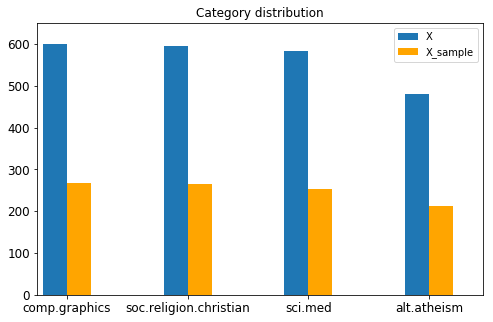

In [7]:
# Answer 
import matplotlib.pyplot as plt
%matplotlib inline
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 650],        
                                    rot = 0, fontsize = 11, figsize = (8,5),align = "edge", width = -0.2,label='X' )


X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, 650], 
                                           rot = 0, fontsize = 12, figsize = (8,5),align = "edge", width = 0.2,color = 'orange',label='X_sample')
plt.legend()

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [8]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)
analyze = count_vect.build_analyzer()
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()



array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [9]:
# Answer here
for i in range(len(np.where(X_counts[0:5, 0:100].toarray()[4]==1)[0])):
    print(count_vect.get_feature_names()[np.where(X_counts[0:5, 0:100].toarray()[4]==1)[0][i]])

# the answer is 01(the second one)

00
01


### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

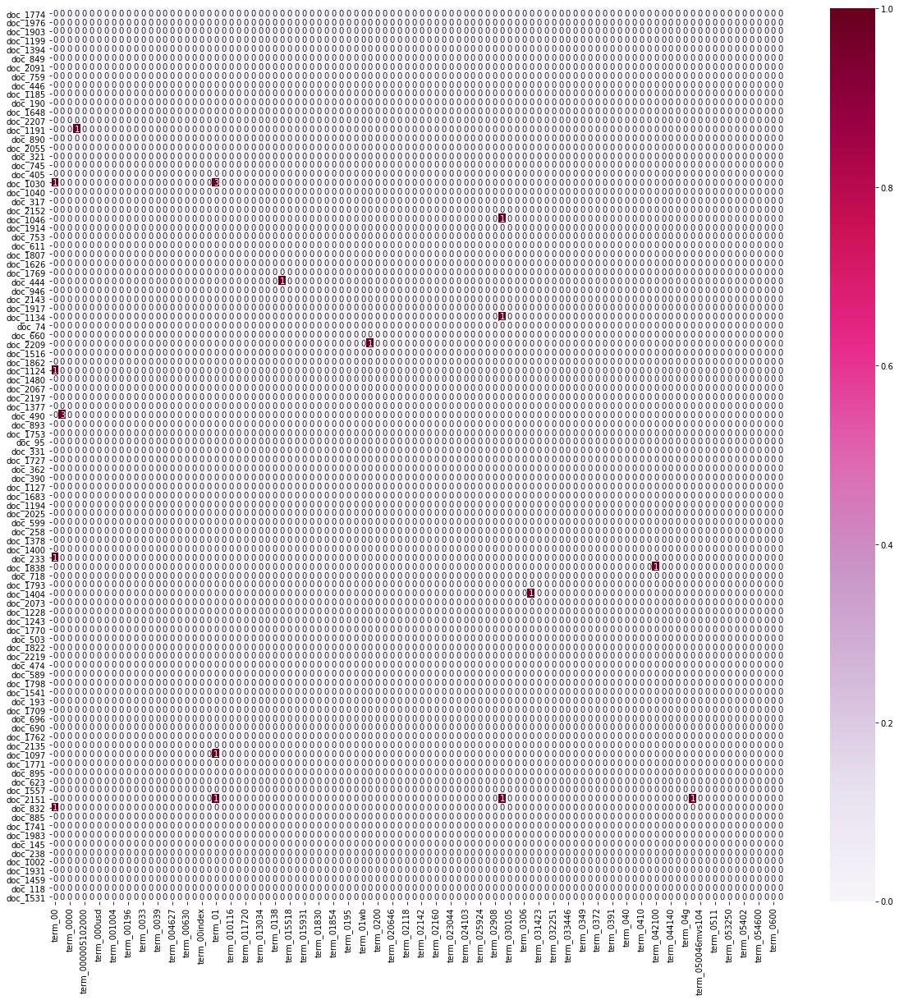

In [10]:
# Answer here
import seaborn as sns

# Sampling
Sample = X.sample(n=1000)

vectorizer = CountVectorizer()
count = vectorizer.fit_transform(Sample.text)

# Plot
plot_x = ["term_"+str(i) for i in vectorizer.get_feature_names()[0:100]]
plot_y = ["doc_"+ str(i) for i in list(Sample.index[0:100])] 
plot_z = count[0:100, 0:100].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)



### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

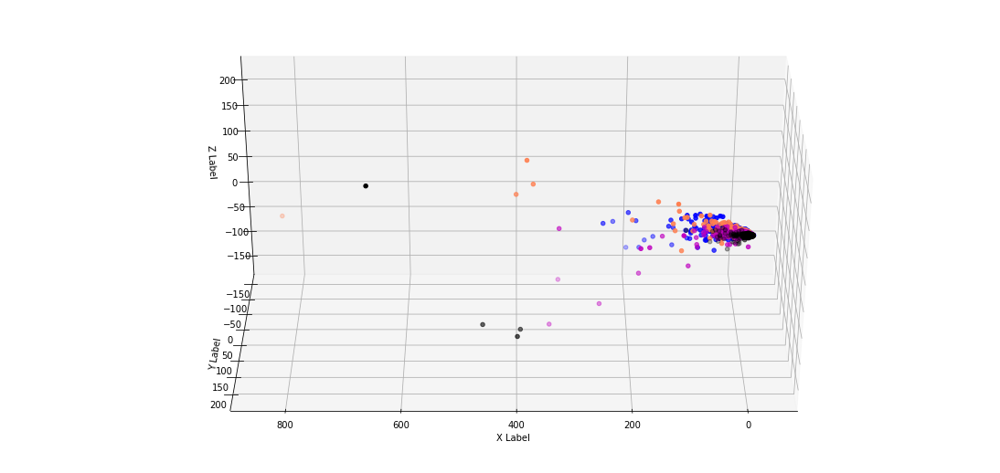

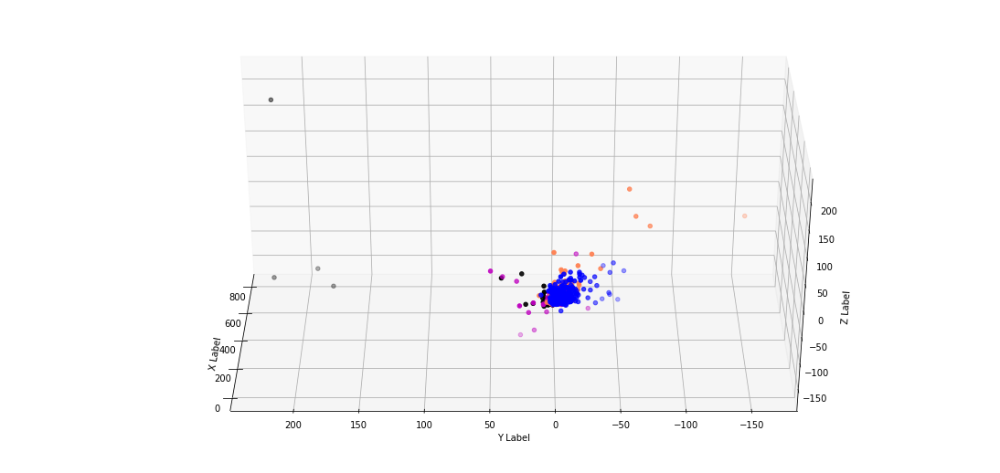

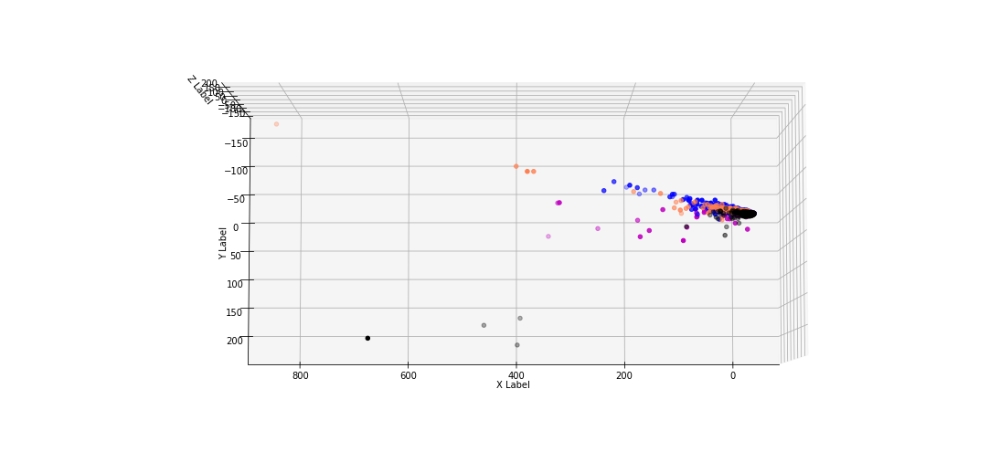

In [11]:
# Answer here
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())

# plot
def plot_3d(X_reduced, ang1, ang2, categories):                        
    col = ['coral', 'blue', 'black', 'm']

    
    fig = plt.figure(figsize = (15,7))
    ax = Axes3D(fig)

    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]         
        ys = X_reduced[X['category_name'] == category].T[1]         
        zs = X_reduced[X['category_name'] == category].T[2]        
   
        ax.scatter(xs, ys, zs, c=c, marker='o')                  

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_xlabel('\nX Label')
    ax.set_ylabel('\nY Label')
    ax.set_zlabel('\nZ Label')
    ax.view_init(ang1,ang2)                                           
    plt.show()
    return ax
    
angles=[[30,90], [30,180], [85,90]]                            
for ang in angles:
    ax = plot_3d(X_reduced, ang[0], ang[1], categories)

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [12]:
term_frequencies=np.asarray(X_counts.sum(axis=0))[0]

In [13]:
# Answer here
import plotly.graph_objects as go
 
fig = go.Figure(                                           
    data=[go.Bar(y=term_frequencies)],
    layout_title_text="Term Frequency" )

fig.update_yaxes(range=[0,250])
fig.update_xaxes(range=[0, 100],                      
                 tickangle=270,
                 ticktext=count_vect.get_feature_names(),
                 tickvals=np.arange(0,len(term_frequencies),1),
                 tickfont=dict(family='serif', color='black', size=12))                             
fig.show()


### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 

In [16]:
#The term_frequencies > 1000
frequent_terms_new = np.where(term_frequencies>1000)[0]

#Plot
fig = go.Figure(                                             
    data=[go.Bar(y=term_frequencies[frequent_terms_new])],    
    layout_title_text="Term Frequency")
fig.update_yaxes(range=[900,30000])
fig.update_xaxes(range=[-1,77],                     
                 tickangle=270,
                 ticktext=np.array(count_vect.get_feature_names())[frequent_terms_new], 
                 tickvals=np.arange(0,len(term_frequencies[frequent_terms_new]),1),
                 tickfont=dict(family='serif', color='black', size=15))                             
fig.show()


### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [18]:
#Sorting
X_count_sort = term_frequencies.argsort()[(-len(term_frequencies)):][::-1]

#Plot
fig = go.Figure(                                           
    data=[go.Bar(y=term_frequencies[X_count_sort])],
    layout_title_text="Term Frequency")

fig.update_yaxes(range=[0,max(term_frequencies)])
fig.update_xaxes(range=[-1, 100],                        
                 tickangle=270,
                 ticktext=np.array(count_vect.get_feature_names())[X_count_sort],
                 tickvals=np.arange(0,len(term_frequencies[X_count_sort]),1),
                 tickfont=dict(family='serif', color='black', size=10))                             
fig.show()

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [17]:
# Answer here
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()

mlb.fit(X.category_name)
mlb.classes_

X['bin_category'] = mlb.transform(X['category_name']).tolist()

X[0:9]

#Yes, it works!

,text,category,category_name,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]"


### >>> **Part 2 :**

### Data Preparation

In [1]:
import pandas as pd
import numpy as np
import helpers.data_mining_helpers as dmh

path = "./sentiment labelled sentences/sentiment labelled sentences/"

f=open(path + 'amazon_cells_labelled.txt', "r")
amazon =f.readlines() 
f.close()

f=open(path + 'imdb_labelled.txt', "r", encoding="utf-8")
imbd =f.readlines()
f.close()

f=open(path + 'yelp_labelled.txt', "r")
yelp =f.readlines()
f.close()

In [2]:
amazon[0:10]

['So there is no way for me to plug it in here in the US unless I go by a converter.\t0\n',
 'Good case, Excellent value.\t1\n',
 'Great for the jawbone.\t1\n',
 'Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!\t0\n',
 'The mic is great.\t1\n',
 'I have to jiggle the plug to get it to line up right to get decent volume.\t0\n',
 'If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.\t0\n',
 'If you are Razr owner...you must have this!\t1\n',
 'Needless to say, I wasted my money.\t0\n',
 'What a waste of money and time!.\t0\n']

In [3]:
imbd[0:10]

['A very, very, very slow-moving, aimless movie about a distressed, drifting young man.  \t0\n',
 'Not sure who was more lost - the flat characters or the audience, nearly half of whom walked out.  \t0\n',
 'Attempting artiness with black & white and clever camera angles, the movie disappointed - became even more ridiculous - as the acting was poor and the plot and lines almost non-existent.  \t0\n',
 'Very little music or anything to speak of.  \t0\n',
 'The best scene in the movie was when Gerardo is trying to find a song that keeps running through his head.  \t1\n',
 "The rest of the movie lacks art, charm, meaning... If it's about emptiness, it works I guess because it's empty.  \t0\n",
 'Wasted two hours.  \t0\n',
 'Saw the movie today and thought it was a good effort, good messages for kids.  \t1\n',
 'A bit predictable.  \t0\n',
 'Loved the casting of Jimmy Buffet as the science teacher.  \t1\n']

In [4]:
yelp[0:10]

['Wow... Loved this place.\t1\n',
 'Crust is not good.\t0\n',
 'Not tasty and the texture was just nasty.\t0\n',
 'Stopped by during the late May bank holiday off Rick Steve recommendation and loved it.\t1\n',
 'The selection on the menu was great and so were the prices.\t1\n',
 'Now I am getting angry and I want my damn pho.\t0\n',
 "Honeslty it didn't taste THAT fresh.)\t0\n",
 'The potatoes were like rubber and you could tell they had been made up ahead of time being kept under a warmer.\t0\n',
 'The fries were great too.\t1\n',
 'A great touch.\t1\n']

In [5]:
len(amazon)

1000

In [6]:
len(imbd)

1000

In [7]:
len(yelp)

1000

### Data transformation

In [8]:
def get_label(data):
    text = []
    label = []
    for i in data:
        text.append(i[0:-3]) 
        label.append(i.split()[-1]) # get the label (sentiment score 0 or 1)
    return text, label

# make dataframe
df_amazon, df_imbd, df_yelp= pd.DataFrame() ,pd.DataFrame(), pd.DataFrame()

# Data transformation
df_amazon['text'], df_amazon['label'] = get_label(amazon)   
df_imbd['text'], df_imbd['label'] = get_label(imbd)    
df_yelp['text'], df_yelp['label'] = get_label(yelp) 

In [9]:
df_amazon[0:10]

,text,label
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up...,0
6,If you have several dozen or several hundred c...,0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


### Data Mining using Pandas
#### Missing Values

In [10]:
df_amazon.isnull().apply(lambda x: dmh.check_missing_values(x))

text     (The amoung of missing records is: , 0)
label    (The amoung of missing records is: , 0)
dtype: object

In [11]:
df_imbd.isnull().apply(lambda x: dmh.check_missing_values(x))

text     (The amoung of missing records is: , 0)
label    (The amoung of missing records is: , 0)
dtype: object

In [12]:
df_yelp.isnull().apply(lambda x: dmh.check_missing_values(x))

text     (The amoung of missing records is: , 0)
label    (The amoung of missing records is: , 0)
dtype: object

#### Dealing with Duplicate Data

In [13]:
#Look there is how many duplicated data

print(sum(df_amazon.duplicated('text')),sum(df_imbd.duplicated('text')),sum(df_yelp.duplicated('text')))

10 3 4


In [14]:
#drop_duplicates

df_amazon.drop_duplicates('text',keep='first', inplace=True)
df_imbd.drop_duplicates('text',keep='first', inplace=True)
df_yelp.drop_duplicates('text',keep='first', inplace=True)


In [15]:
#Look there is how many duplicated data

print(sum(df_amazon.duplicated('text')),sum(df_imbd.duplicated('text')),sum(df_yelp.duplicated('text')))

0 0 0


### Data Preprocessing

### Feature Creation

In [16]:
import re

# clean data

def clean_data(a):
    for i in range(len(a)):
        a[i].replace("-", " ")
        a[i].replace("_", " ")
        a[i] = re.sub(r'[^\w\s\r]',' ',a[i])
    return a

df_amazon.text = clean_data(list(df_amazon.text))
df_imbd.text = clean_data(list(df_imbd.text))
df_yelp.text = clean_data(list(df_yelp.text))
print(df_amazon.text[0:5])

0    So there is no way for me to plug it in here i...
1                          Good case  Excellent value 
2                               Great for the jawbone 
3    Tied to charger for conversations lasting more...
4                                    The mic is great 
Name: text, dtype: object


In [17]:
#creat stop words

from nltk.stem.porter import PorterStemmer
import nltk
from nltk.corpus import stopwords
porter = PorterStemmer()

def tokenizer_porter(text):
    return [porter.stem(word) for word in text.split()]
nltk.download('stopwords')
stop = stopwords.words('english')
stop = [tokenizer_porter(item)[0] for item in stop] 
stop.extend(['becau'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\binbin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
#remove stop words and then tokenize

from sklearn.feature_extraction.text import CountVectorizer

CountVectorizer_amazon = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
amazon_counts = CountVectorizer_amazon.fit_transform(df_amazon.text)

CountVectorizer_imbd = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
imbd_counts = CountVectorizer_imbd.fit_transform(df_imbd.text)

CountVectorizer_yelp = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
yelp_counts = CountVectorizer_yelp.fit_transform(df_yelp.text)


 ### Feature subset selection

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# amazon
# Sampling 
Sample_amazon = df_amazon.sample(n=300)

vectorizer = CountVectorizer()
count = vectorizer.fit_transform(Sample_amazon.text)

# Plot
plot_x = ["term_"+str(i) for i in vectorizer.get_feature_names()[0:100]]
plot_y = ["Amazon_"+ str(i) for i in list(Sample_amazon.index[0:100])] 
plot_z = count[0:100, 0:100].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)



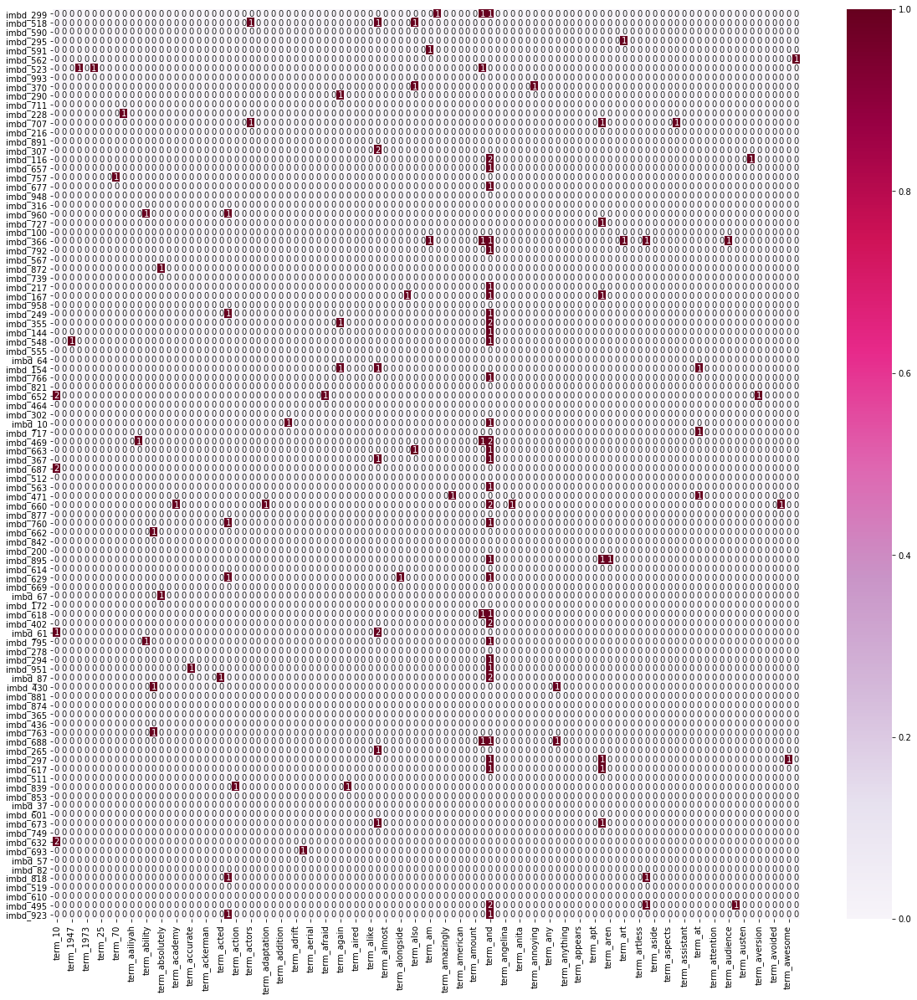

In [20]:
# imbd
# Sampling 
Sample_imbd = df_imbd.sample(n=300)

vectorizer = CountVectorizer()
count = vectorizer.fit_transform(Sample_imbd.text)

# Plot
plot_x = ["term_"+str(i) for i in vectorizer.get_feature_names()[0:100]]
plot_y = ["imbd_"+ str(i) for i in list(Sample_imbd.index[0:100])] 
plot_z = count[0:100, 0:100].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)


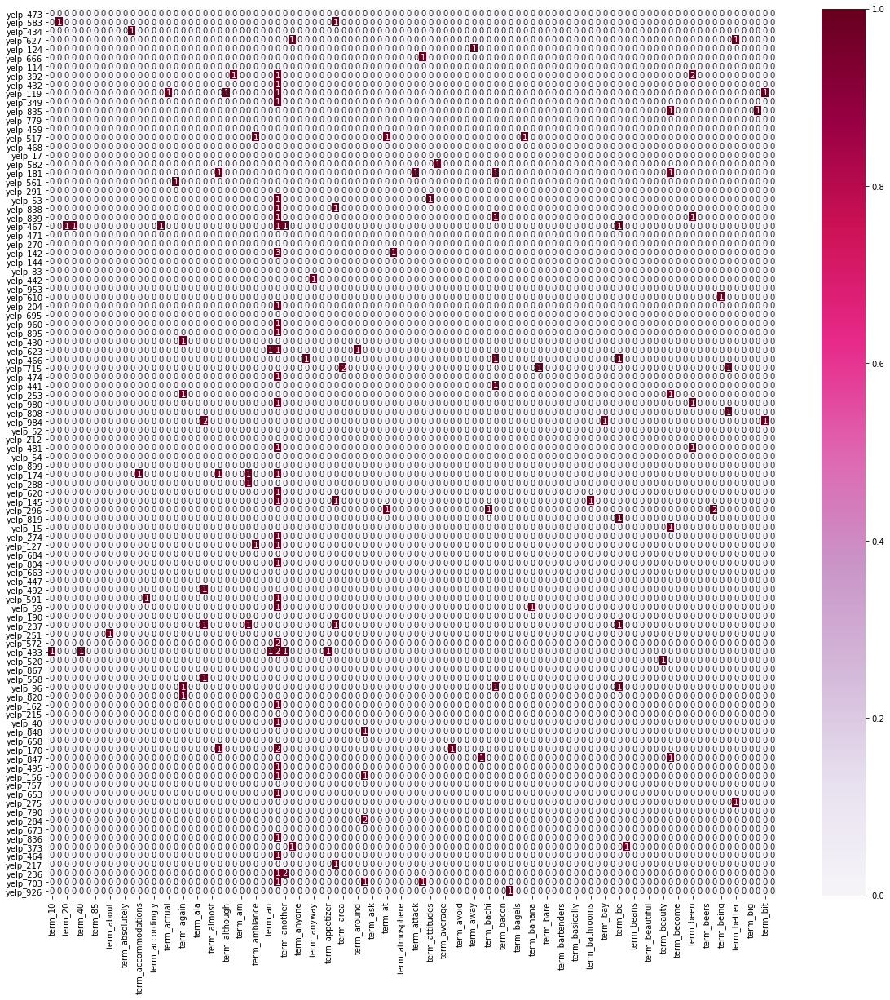

In [21]:
# yelp
# Sampling 
Sample_yelp = df_yelp.sample(n=300)

vectorizer = CountVectorizer()
count = vectorizer.fit_transform(Sample_yelp.text)

# Plot
plot_x = ["term_"+str(i) for i in vectorizer.get_feature_names()[0:100]]
plot_y = ["yelp_"+ str(i) for i in list(Sample_yelp.index[0:100])] 
plot_z = count[0:100, 0:100].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(20, 20))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)


#### Dimensionality Reduction

In [22]:
from sklearn.decomposition import PCA

# reduce to 2D
pca = PCA(n_components = 2)

amazon_2d = pca.fit_transform(amazon_counts.toarray())

imbd_2d = pca.fit_transform(imbd_counts.toarray())

yelp_2d = pca.fit_transform(yelp_counts.toarray())

print('shape of amazon_2d:',amazon_2d.shape,'shape of imbd_2d:',imbd_2d.shape,'shape of yelp_2d:',yelp_2d.shape, sep='\n')


shape of amazon_2d:
(990, 2)
shape of imbd_2d:
(997, 2)
shape of yelp_2d:
(996, 2)


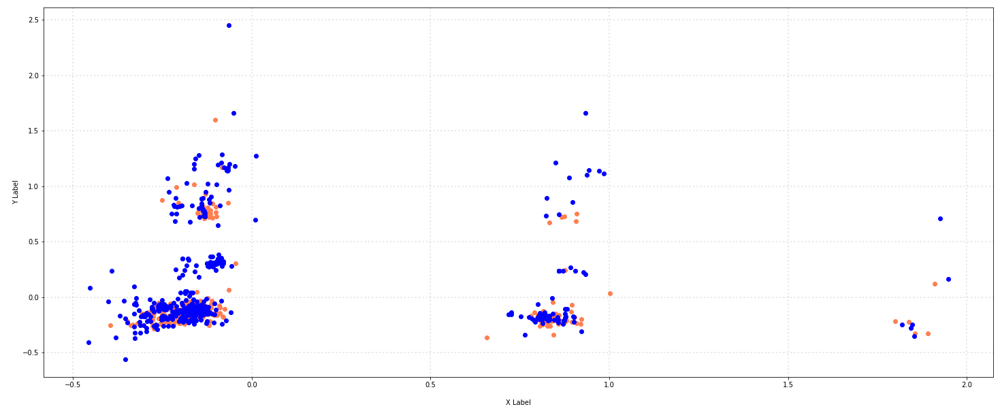

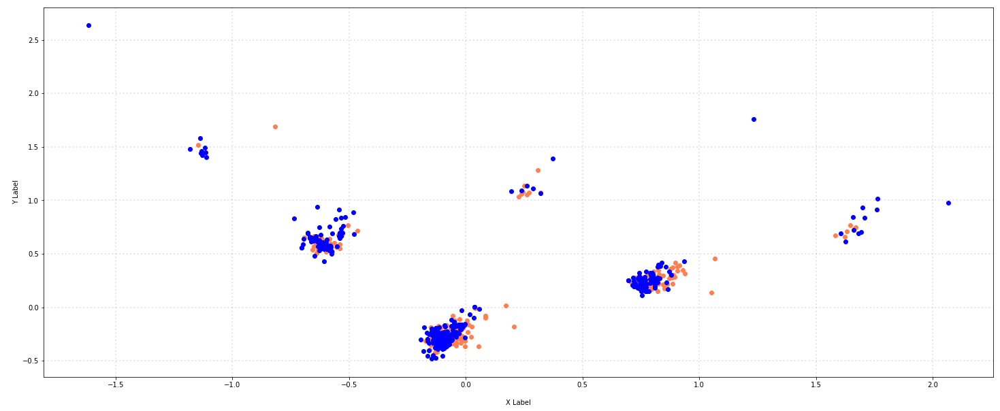

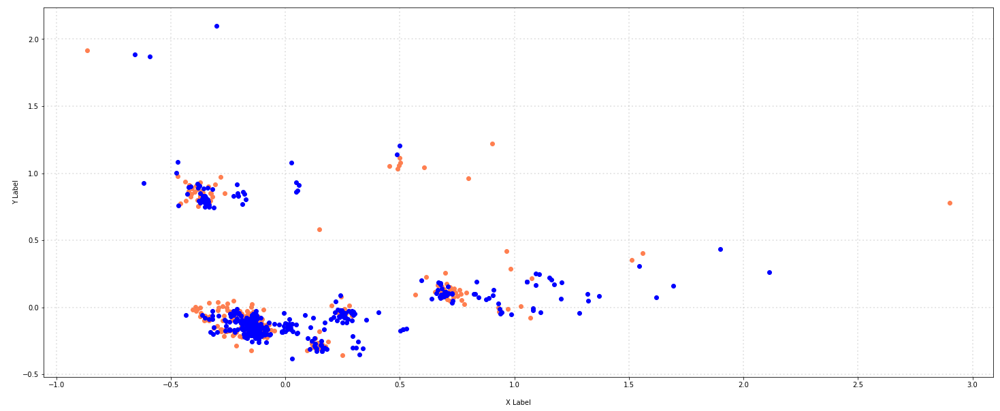

In [23]:
#Plot

col = ['coral', 'blue', 'black', 'm']
categories = ['0','1']
def plot_2D(col, categories, X_reduced, X):
    fig = plt.figure(figsize = (25,10))
    ax = fig.subplots()
    for c, category in zip(col, categories):
        xs = X_reduced[X['label'] == category].T[0]
        ys = X_reduced[X['label'] == category].T[1]   
        ax.scatter(xs, ys, c = c, marker='o')
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_xlabel('\nX Label')
    ax.set_ylabel('\nY Label')
    plt.show()
    
    
plot_2D(col, categories, amazon_2d, df_amazon)
plot_2D(col, categories, imbd_2d, df_imbd)
plot_2D(col, categories, yelp_2d, df_yelp)

###  Atrribute Transformation / Aggregation

In [24]:
amazon_term_frequencies = np.asarray(amazon_counts.sum(axis=0))[0]
imbd_term_frequencies = np.asarray(imbd_counts.sum(axis=0))[0]
yelp_term_frequencies = np.asarray(yelp_counts.sum(axis=0))[0]

In [25]:
import plotly.graph_objects as go

#Sorting
amazon_count_sort = amazon_term_frequencies.argsort()[(-len(amazon_term_frequencies)):][::-1]
imbd_count_sort = imbd_term_frequencies.argsort()[(-len(imbd_term_frequencies)):][::-1]
yelp_count_sort = yelp_term_frequencies.argsort()[(-len(yelp_term_frequencies)):][::-1]

#Plot
def plot_sorted_freq_curve(dataset,X_count_rank_idx, term_frequencies, feature_names):
    
    fig = go.Figure(                                           
        data=[go.Bar(y=term_frequencies[X_count_rank_idx])],
        layout_title_text= dataset + " Term Frequency " 
    )
    fig.update_yaxes(range=[0,max(term_frequencies)+100])
    fig.update_xaxes(range=[-1, 101],                        
                     tickangle=270,
                     ticktext=np.array(feature_names)[X_count_rank_idx],
                     tickvals=np.arange(0,len(term_frequencies[X_count_rank_idx]),1),
                     tickfont=dict(family='serif', color='black', size=10))                             
    fig.show()
    print('Top 10 frequency words: ',np.array(feature_names)[X_count_rank_idx][0:10])
    
plot_sorted_freq_curve('amazon',amazon_count_sort ,amazon_term_frequencies ,CountVectorizer_amazon.get_feature_names())
plot_sorted_freq_curve('imbd',imbd_count_sort ,imbd_term_frequencies,CountVectorizer_imbd.get_feature_names())
plot_sorted_freq_curve('yelp',yelp_count_sort,yelp_term_frequencies, CountVectorizer_yelp.get_feature_names())

Top 10 frequency words:  ['phone' 'work' 'great' 'good' 'use' 'headset' 'product' 'qualiti'
 'batteri' 'sound']


Top 10 frequency words:  ['movi' 'film' 'one' 'bad' 'like' 'charact' 'good' 'time' 'watch' 'act']


Top 10 frequency words:  ['food' 'place' 'good' 'servic' 'great' 'go' 'back' 'time' 'like' 'realli']


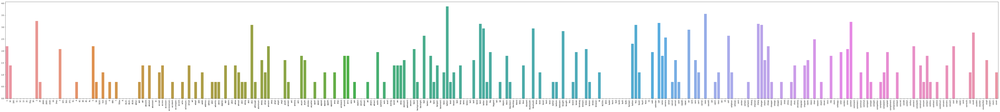

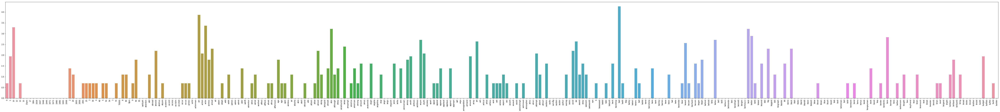

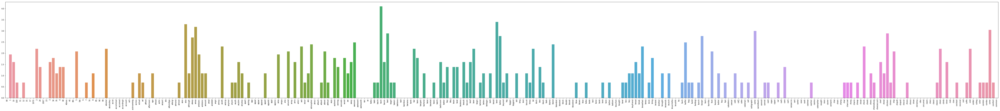

In [44]:
#log
import math

amazon_term_frequencies_log = [math.log(i) for i in amazon_term_frequencies]
imbd_term_frequencies_log = [math.log(i) for i in imbd_term_frequencies]
yelp_term_frequencies_log = [math.log(i) for i in yelp_term_frequencies]

def plot_log( term_frequencies_log , CountVectorizer):
    plt.subplots(figsize=(100, 10))
    g = sns.barplot(x=CountVectorizer.get_feature_names()[:300],
                    y=term_frequencies_log[:300])
    g.set_xticklabels(CountVectorizer.get_feature_names()[:300], rotation = 90);
    
    
plot_log( amazon_term_frequencies_log, CountVectorizer_amazon)
plot_log( imbd_term_frequencies_log, CountVectorizer_imbd)
plot_log( yelp_term_frequencies_log, CountVectorizer_yelp)


# Data Exploration

In [109]:
# We retrieve 2 sentences for a random record, here, indexed at 50 and 100
document_to_transform_1 = []
random_record_1 = df_amazon.iloc[50]
random_record_1 = random_record_1['text']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df_imbd.iloc[600]
random_record_2 = random_record_2['text']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df_yelp.iloc[59]
random_record_3 = random_record_3['text']
document_to_transform_3.append(random_record_3)

In [110]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['Not loud enough and doesn t turn on like it should ']
['I saw this movie and I thought this is a stupid movie   ']
['The ripped banana was not only ripped  but petrified and tasteless ']


In [113]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = CountVectorizer_amazon.fit_transform(document_to_transform_1)
document_vector_count_2 = CountVectorizer_imbd.fit_transform(document_to_transform_2)
document_vector_count_3 = CountVectorizer_yelp.fit_transform(document_to_transform_3)

# print
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[1 1 1 1]]
[[2 1 1 1]]
[[1 1 2 1]]


In [112]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})

Cosine Similarity using count bw 1 and 2: 0.944911
Cosine Similarity using count bw 1 and 3: 0.944911
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000


### Part3


### TF-IDF features from training data

In [117]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    print(cm)
    
def train_tfidf(X,y,data):
    class_names = [0,1]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42,stratify=y)
    
    tfidf_vect = TfidfVectorizer(stop_words=stop,tokenizer=tokenizer_porter)

    tfidf_train = tfidf_vect.fit_transform(X_train)

    tfidf_test = tfidf_vect.transform(X_test)
    
    alphas = [0.001, 0.01, 0.1, 1]
    print('Parameters and results for ' + str(data))
    for a in alphas:
        clf = MultinomialNB(alpha=a)
        clf.fit(tfidf_train.toarray(), y_train)
        y_predict = clf.predict(tfidf_test.toarray())
        
        uar = recall_score(y_test, y_predict, average='macro')
        cm = confusion_matrix(y_test, y_predict)        
        print('alpha = ' + str(a) + '/ accuracy: ' + str(clf.score(tfidf_test.toarray(),y_test)) + '/ UAR: ' + str(uar))
        plot_confusion_matrix(cm , class_names)
        print("")
    print("___________________________________________________________")   

# train and predict
train_tfidf(df_amazon.text, df_amazon.label.astype(int), 'Amazon')
train_tfidf(df_imbd.text, df_imbd.label.astype(int), 'IMBD')
train_tfidf(df_yelp.text, df_yelp.label.astype(int), 'Yelp')

Parameters and results for Amazon
alpha = 0.001/ accuracy: 0.7492354740061162/ UAR: 0.7493266497082149
Confusion matrix
[[118  46]
 [ 36 127]]

alpha = 0.01/ accuracy: 0.7553516819571865/ UAR: 0.7554429148585964
Confusion matrix
[[119  45]
 [ 35 128]]

alpha = 0.1/ accuracy: 0.7675840978593272/ UAR: 0.7676941493341314
Confusion matrix
[[120  44]
 [ 32 131]]

alpha = 1/ accuracy: 0.764525993883792/ UAR: 0.7647762980697292
Confusion matrix
[[112  52]
 [ 25 138]]

___________________________________________________________
Parameters and results for IMBD
alpha = 0.001/ accuracy: 0.7575757575757576/ UAR: 0.7575757575757576
Confusion matrix
[[120  45]
 [ 35 130]]

alpha = 0.01/ accuracy: 0.7575757575757576/ UAR: 0.7575757575757576
Confusion matrix
[[120  45]
 [ 35 130]]

alpha = 0.1/ accuracy: 0.7575757575757576/ UAR: 0.7575757575757576
Confusion matrix
[[123  42]
 [ 38 127]]

alpha = 1/ accuracy: 0.7909090909090909/ UAR: 0.7909090909090909
Confusion matrix
[[124  41]
 [ 28 137]]

_________

### Naive Bayes classifier

In [119]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

def train_count(X,y,data):
    class_names = [0,1]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42,stratify=y)
    
    count_vect = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
    
    count_train = count_vect.fit_transform(X_train)
    
    count_test = count_vect.transform(X_test)
    
    alphas = [0.001, 0.01, 0.1, 1]
    print('Parameters and results for ' + str(data))
    for a in alphas:
        clf = MultinomialNB(alpha=a)
        clf.fit(count_train.toarray(), y_train)
        y_predict = clf.predict(count_test.toarray())
        
        uar = recall_score(y_test, y_predict, average='macro')
        cm = confusion_matrix(y_test, y_predict)        
        print('alpha = ' + str(a) + '/ accuracy: ' + str(clf.score(count_test.toarray(),y_test)) + '/ UAR: ' + str(uar))
        plot_confusion_matrix(cm , class_names)
        print("")
    print("___________________________________________________________")   

# train and predict
train_count(df_amazon.text, df_amazon.label.astype(int), 'Amazon')
train_count(df_imbd.text, df_imbd.label.astype(int), 'IMBD')
train_count(df_yelp.text, df_yelp.label.astype(int), 'Yelp')

Parameters and results for Amazon
alpha = 0.001/ accuracy: 0.7522935779816514/ UAR: 0.7523567260212479
Confusion matrix
[[120  44]
 [ 37 126]]

alpha = 0.01/ accuracy: 0.7614678899082569/ UAR: 0.761559180008978
Confusion matrix
[[120  44]
 [ 34 129]]

alpha = 0.1/ accuracy: 0.7706422018348624/ UAR: 0.770761633996708
Confusion matrix
[[120  44]
 [ 31 132]]

alpha = 1/ accuracy: 0.7889908256880734/ UAR: 0.7891665419721682
Confusion matrix
[[120  44]
 [ 25 138]]

___________________________________________________________
Parameters and results for IMBD
alpha = 0.001/ accuracy: 0.7606060606060606/ UAR: 0.7606060606060605
Confusion matrix
[[121  44]
 [ 35 130]]

alpha = 0.01/ accuracy: 0.7666666666666667/ UAR: 0.7666666666666666
Confusion matrix
[[122  43]
 [ 34 131]]

alpha = 0.1/ accuracy: 0.7727272727272727/ UAR: 0.7727272727272727
Confusion matrix
[[126  39]
 [ 36 129]]

alpha = 1/ accuracy: 0.7848484848484848/ UAR: 0.7848484848484849
Confusion matrix
[[127  38]
 [ 33 132]]

__________

### Part4

We haven't remove stop words and stemming words on data in the lab, so there is a lot of words we do not want.

